In [1]:
import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

In [2]:
%pylab inline
%matplotlib inline

import warnings
warnings.filterwarnings('ignore')

################################################################################

from tqdm import tqdm
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import glob
import cv2
import os
from datetime import datetime

################################################################################

import tensorflow.compat.v2 as tf
from tensorflow.keras.models import *
from tensorflow.keras.layers import *
from tensorflow.keras.optimizers import *
from tensorflow.python.keras.losses import BinaryCrossentropy
from tensorflow.keras.applications.vgg16 import VGG16
from segmentation_models.losses import jaccard_loss, dice_loss, categorical_focal_loss, categorical_focal_jaccard_loss, categorical_focal_dice_loss

################################################################################
try :
    import import_ipynb
except :
    !pip install import-ipynb
    import import_ipynb
from Brice_KENGNI_ZANGUIM_2_1_script_functions_25_10_2022 import *

%pylab is deprecated, use %matplotlib inline and import the required libraries.
Populating the interactive namespace from numpy and matplotlib
Segmentation Models: using `keras` framework.
importing Jupyter notebook from Brice_KENGNI_ZANGUIM_2_1_script_functions_25_10_2022.ipynb


In [3]:
config = tf.compat.v1.ConfigProto( device_count = { 'GPU': 5 , 'CPU': 1 } )
sess = tf.compat.v1.Session( config = config )
keras.backend.set_session( sess )

In [4]:
tf.config.list_physical_devices("GPU")

[]

In [5]:
tf.__version__

'2.9.1'

In [6]:
keras.__version__

'2.9.0'

In [7]:
pd.__version__

'1.4.4'

In [8]:
np.__version__

'1.21.5'

In [9]:
model_name = "Transfert_learning_UNET+512-32"

# <strong> I - Acquisition des données à utiliserMaxNLocator

- ###  <strong> Chemin d'accès aux fichiers images et aux masks </strong>

In [10]:
chemin_image = os.getcwd()+"/datas/contraste/" 
chemin_masque_labelIds = os.getcwd()+"/datas/masque_labelIds/" 

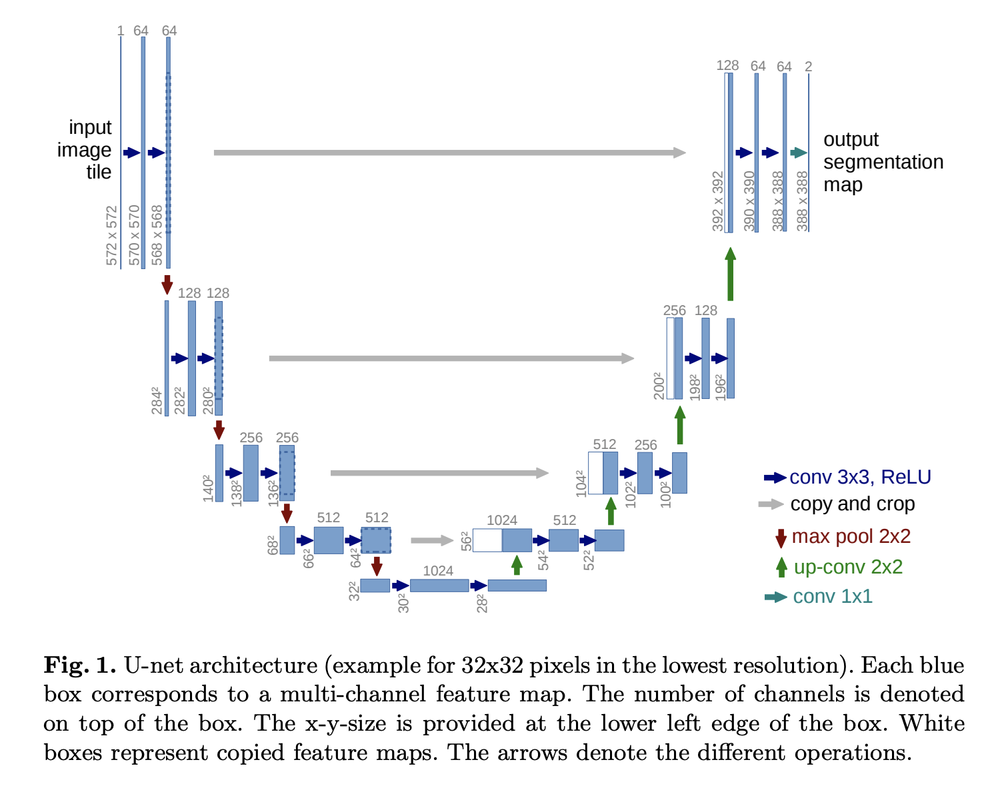

# <strong> II - Construction du modèle

- ###  <strong> definition </strong>

In [11]:
# Modèle UNET préentrainé sur Imagenet avec une couche de compression de type VGG16
def TL_unet_model(input_shape, Canaux_de_sortie, by = "seg_model"):

    if by =="build" :
        base_VGG = VGG16(include_top = False, 
                       weights = "imagenet", 
                       input_shape = input_shape)

        # On interdit l'entrainement des couche de convolution du modèle VGG16
        # Uniquement les paramètres de la couche de décodage seront entrainés
        for layer in base_VGG.layers: 
            layer.trainable = False

        # the bridge (exclude the last maxpooling layer in VGG16) 
        bridge = base_VGG.get_layer("block5_conv3").output
        #print(bridge.shape)

        # Décodeur
        up1 = Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(bridge)
        #print(up1.shape)
        concat_1 = concatenate([up1, base_VGG.get_layer("block4_conv3").output], axis=3)
        conv6 = Conv2D(256, (3, 3), activation='relu', padding='same')(concat_1)
        conv6 = Conv2D(256, (3, 3), activation='relu', padding='same')(conv6)

        up2 = Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(conv6)
        #print(up2.shape)
        concat_2 = concatenate([up2, base_VGG.get_layer("block3_conv3").output], axis=3)
        conv7 = Conv2D(128, (3, 3), activation='relu', padding='same')(concat_2)
        conv7 = Conv2D(128, (3, 3), activation='relu', padding='same')(conv7)

        up3 = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(conv7)
        #print(up3.shape)
        concat_3 = concatenate([up3, base_VGG.get_layer("block2_conv2").output], axis=3)
        conv8 = Conv2D(64, (3, 3), activation='relu', padding='same')(concat_3)
        conv8 = Conv2D(64, (3, 3), activation='relu', padding='same')(conv8)

        up4 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(conv8)
        #print(up4.shape)
        concat_4 = concatenate([up4, base_VGG.get_layer("block1_conv2").output], axis=3)
        conv9 = Conv2D(32, (3, 3), activation='relu', padding='same')(concat_4)
        conv9 = Conv2D(32, (3, 3), activation='relu', padding='same')(conv9)

        conv10 = Conv2D(Canaux_de_sortie, (1, 1), activation='softmax')(conv9)
        #print(conv10.shape)

        model = Model( base_VGG.input, conv10 )
    elif by == "seg_model" :
        from segmentation_models import Unet
        
        model = Unet( 
                backbone_name='vgg16',
                input_shape= input_shape,
                classes= Canaux_de_sortie,
                activation='softmax',
                weights=None,
                encoder_weights='imagenet',
                encoder_freeze=True,
                encoder_features='default',
                decoder_block_type='upsampling',
                decoder_filters=(512, 256, 128, 64, 32),
                decoder_use_batchnorm=True,
                
                )
        
    model.summary()
    return model

# <strong> A - Sans augmentation de données avec fonction perte de type jaccard_loss

In [12]:
#resolution des images et masques
aug_1 = False
perte_1 = "jaccard_loss"
img_res = (128,256,3)

In [13]:
model_1 = TL_unet_model( img_res , 8)

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 128, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 block1_conv1 (Conv2D)          (None, 128, 256, 64  1792        ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 block1_conv2 (Conv2D)          (None, 128, 256, 64  36928       ['block1_conv1[0][0]']           
                                )                                                             

In [14]:
# binary_crossentropy, categorical_crossentropy, sparse_categorical_crossentropy

model_1.compile(optimizer = Adam(lr = 2.e-2), 
                loss = jaccard_loss , 
                metrics = [ ARI_score, mean_IoU, dice_coeff, Tversky_coef ],
                run_eagerly=True
               )  

##################################################
###########     POINTS DE CONTROLE     ###########
checkpoint_path_1 = f"models/{model_name}_Loss={perte_1}_aug={aug_1}_/cp.ckpt"
checkpoint_dir_1 = os.path.dirname(checkpoint_path_1)


#############################################
###########     MES CALBACKS     ############
# Seuil de convergence
my_callback = MyCallback(0.95)
# Update du learning rate
learning_rate_callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
# Sauvegarde des poids du modèle
cp_callback_1 = tf.keras.callbacks.ModelCheckpoint(filepath = checkpoint_path_1,
                                                   save_weights_only = True,
                                                   verbose = 1,
                                                   save_freq=125
                                                  )
early_stopping_1 = tf.keras.callbacks.EarlyStopping(
                                                    monitor='loss',
                                                    min_delta=0.001,
                                                    patience=10,
                                                    verbose= 1,
                                                    mode='min',
                                                    baseline=None,
                                                    restore_best_weights=True
                                                    )

###################################################
###############                     ###############
MyImagesGenerator.nombre_d_instances = 0
charger_les_poids_1 = False

In [15]:
if  charger_les_poids_1 :
    model_1.load_weights(checkpoint_path_1)
    
history_1 = model_1.fit_generator( 
    generator = MyImagesGenerator(chemin_image, chemin_masque_labelIds,25, True, augmentation=aug_1, taille_des_donnees= 50, target_size=img_res),
    validation_data = MyImagesGenerator(chemin_image, chemin_masque_labelIds,10, True, augmentation=aug_1, taille_des_donnees= 20, target_size=img_res),
    epochs= 450,
    max_queue_size=12,
    callbacks = [ my_callback, learning_rate_callback, cp_callback_1 , early_stopping_1] ,
    use_multiprocessing= False
)
# Sauvegarde complète du modèle
model_1.save(checkpoint_dir_1+f"/Complete_model_date={datetime.today().strftime('%Y_%m_%d-%Hh%Mmin%Ssec')}.h5")


Epoch 1/450
2/2 [==============================] - 43s 21s/step - loss: 0.4628 - ARI_score: 7.3399 - mean_IoU: 0.6747 - dice_coeff: 0.8057 - Tversky_coef: 0.2622 - val_loss: 0.6114 - val_ARI_score: 2.0886 - val_mean_IoU: 0.5239 - val_dice_coeff: 0.6874 - val_Tversky_coef: 0.2518 - lr: 0.0268
Epoch 2/450
2/2 [==============================] - 36s 18s/step - loss: 0.4334 - ARI_score: -4.2314 - mean_IoU: 0.7007 - dice_coeff: 0.8240 - Tversky_coef: 0.2639 - val_loss: 0.6517 - val_ARI_score: -1.0757 - val_mean_IoU: 0.4732 - val_dice_coeff: 0.6416 - val_Tversky_coef: 0.2478 - lr: 0.0268
Epoch 3/450
2/2 [==============================] - 33s 17s/step - loss: 0.4198 - ARI_score: -4.5892 - mean_IoU: 0.7152 - dice_coeff: 0.8339 - Tversky_coef: 0.2647 - val_loss: 0.6468 - val_ARI_score: 0.5453 - val_mean_IoU: 0.4917 - val_dice_coeff: 0.6590 - val_Tversky_coef: 0.2493 - lr: 0.0268
Epoch 4/450
2/2 [==============================] - 33s 17s/step - loss: 0.4111 - ARI_score: -1.2220 - mean_IoU: 0.7237

In [16]:
result_1  = pd.DataFrame( history_1.history )
result_1.drop(["lr"], axis=1, inplace=True)
result_1["modèle"] = [model_name for _ in range( result_1.shape[0])]
result_1["Loss"] = [perte_1 for _ in range( result_1.shape[0])]
result_1["Augmentation"] = [aug_1 for _ in range( result_1.shape[0])]
result_1.to_csv( f"{model_name}_loss={perte_1}_augment={aug_1}_date={datetime.today().strftime('%Y_%m_%d-%Hh%Mmin%Ssec')}.csv", index = False )
result_1

,loss,ARI_score,mean_IoU,dice_coeff,Tversky_coef,val_loss,val_ARI_score,val_mean_IoU,val_dice_coeff,val_Tversky_coef,modèle,Loss,Augmentation
0,0.462831,7.339851,0.674688,0.805661,0.262246,0.611375,2.088602,0.523917,0.687437,0.251812,Transfert_learning_UNET+512-32,jaccard_loss,False
1,0.433382,-4.231377,0.700688,0.824005,0.263862,0.651748,-1.075725,0.473185,0.641644,0.247771,Transfert_learning_UNET+512-32,jaccard_loss,False
2,0.419835,-4.589221,0.715198,0.833908,0.264735,0.646795,0.545263,0.491722,0.659022,0.249297,Transfert_learning_UNET+512-32,jaccard_loss,False
3,0.411117,-1.222023,0.723697,0.839696,0.265247,0.631999,-0.485063,0.520384,0.684432,0.251538,Transfert_learning_UNET+512-32,jaccard_loss,False
4,0.392166,1.539932,0.739615,0.850304,0.266183,0.614897,2.971000,0.544223,0.704821,0.253340,Transfert_learning_UNET+512-32,jaccard_loss,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...
67,0.285053,-14.718944,0.832709,0.908687,0.271327,0.479194,1.576707,0.685337,0.813175,0.262896,Transfert_learning_UNET+512-32,jaccard_loss,False
68,0.279254,0.563766,0.833664,0.909265,0.271377,0.478250,6.726089,0.683611,0.812075,0.262798,Transfert_learning_UNET+512-32,jaccard_loss,False
69,0.282126,-12.892673,0.837795,0.911725,0.271594,0.461095,-3.829801,0.695058,0.819938,0.263491,Transfert_learning_UNET+512-32,jaccard_loss,False
70,0.273507,-1.293154,0.836693,0.911078,0.271537,0.488214,1.423238,0.674152,0.805276,0.262199,Transfert_learning_UNET+512-32,jaccard_loss,False


In [17]:
start = 2

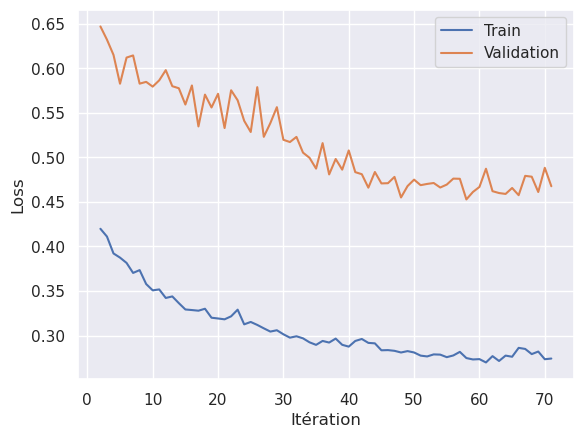

In [18]:
plt.plot(result_1.index[start:], result_1["loss"][start:])
plt.plot(result_1.index[start:], result_1["val_loss"][start:])
plt.xlabel('Itération')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'], loc='best')
plt.show()
#plt.plot(result.index, result["dice_coeff"])


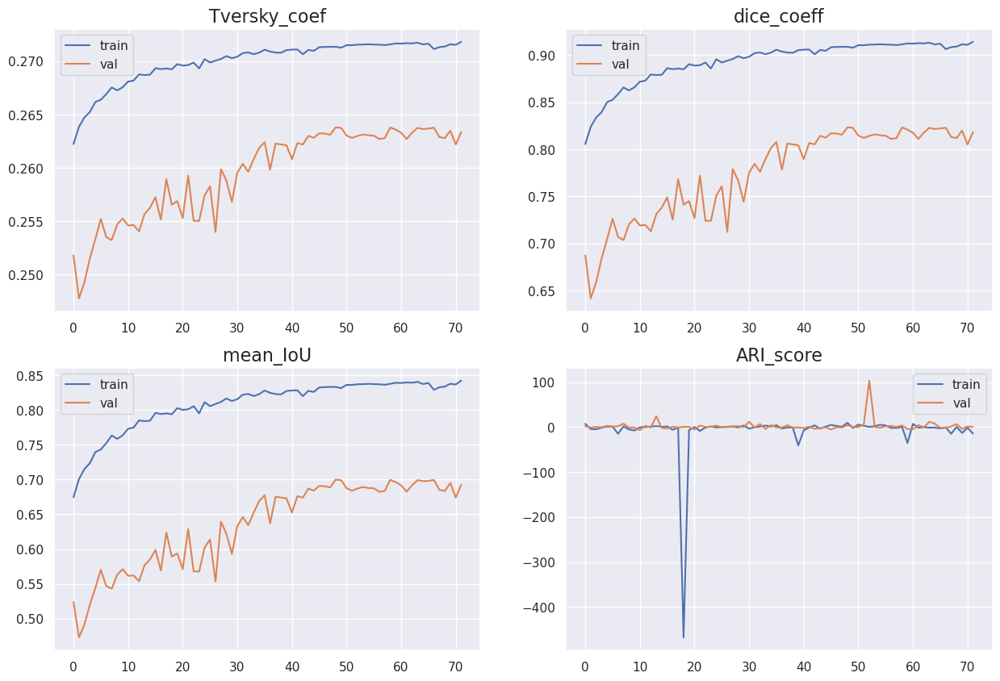

In [19]:
afficher_les_metriques( result_1 )

In [20]:
img_gen = MyImagesGenerator( chemin_image, chemin_masque_labelIds,10, True, augmentation=aug_1, taille_des_donnees = 30 , target_size=img_res)

img, mask = img_gen.__getitem__(0)

In [21]:
img.shape

(10, 128, 256, 3)

In [22]:
mask.shape

(10, 128, 256, 8)

In [23]:
mask_pred = model_1.predict(img)

1/1 [==============================] - 1s 1s/step


In [24]:
mask_pred.shape

(10, 128, 256, 8)

In [25]:
transformer = Mask_To_8_Groups( )

In [26]:
mask_pred = [ transformer.invers_transform(i) for i in mask_pred ]

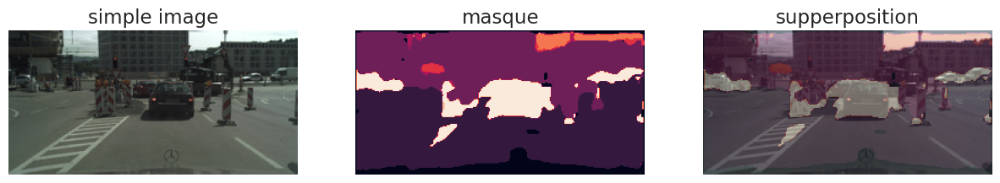

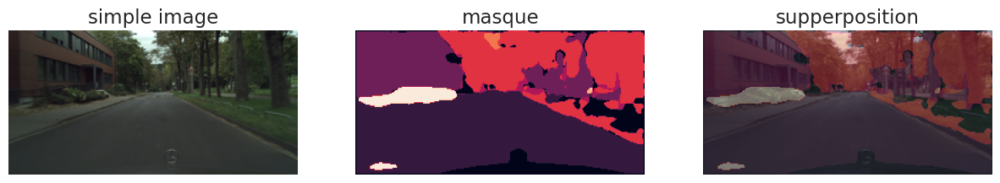

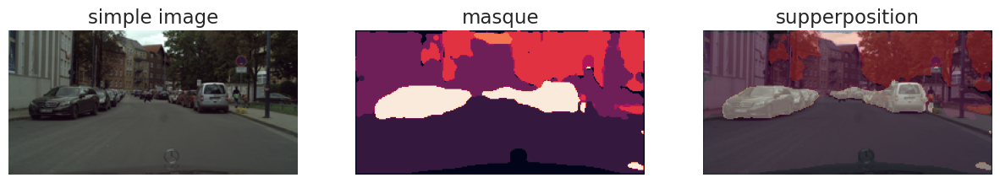

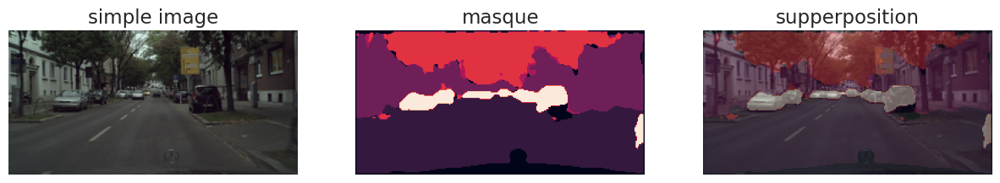

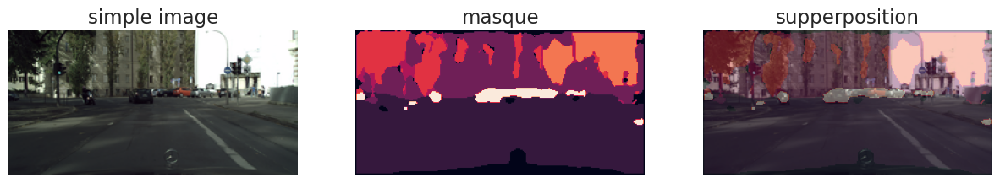

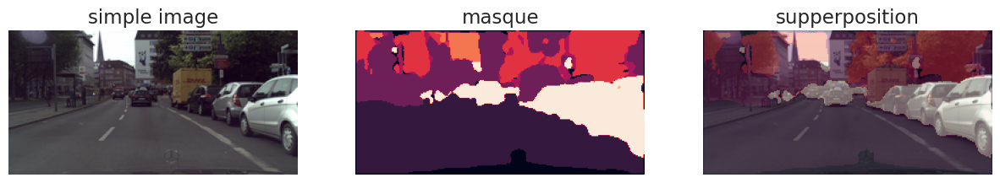

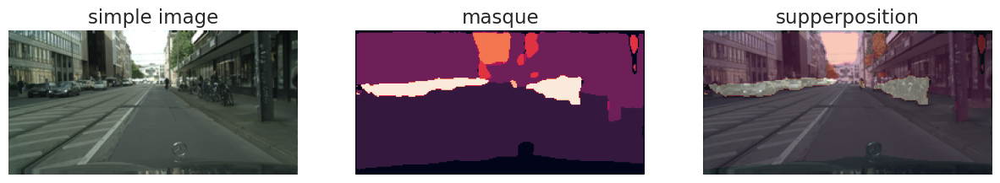

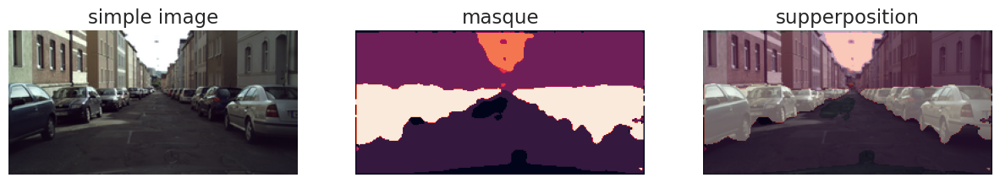

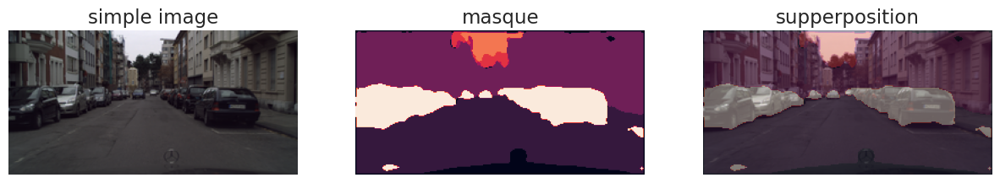

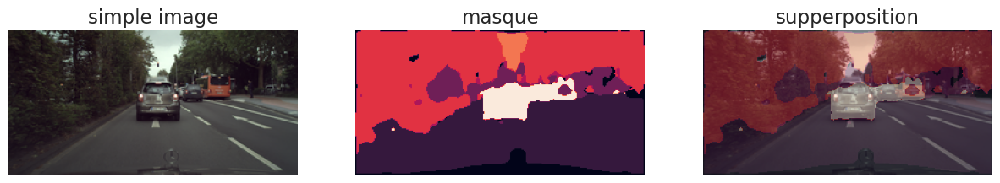

In [27]:
for i in range(10) :
    afficher_les_images_supperposees(img[i], mask_pred[i], style=3)

# <strong> B - Sans augmentation de données et fonction perte de type dice_loss

In [28]:
#resolution des images et masques
aug_2 = False
perte_2 = "dice_loss"
img_res = (128,256,3)

In [29]:
model_2 = TL_unet_model( img_res , 8)

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 128, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 block1_conv1 (Conv2D)          (None, 128, 256, 64  1792        ['input_2[0][0]']                
                                )                                                                 
                                                                                                  
 block1_conv2 (Conv2D)          (None, 128, 256, 64  36928       ['block1_conv1[0][0]']           
                                )                                                           

In [30]:
# binary_crossentropy, categorical_crossentropy, sparse_categorical_crossentropy

model_2.compile(optimizer = Adam(lr = 2.e-2),
                loss = dice_loss ,
                metrics = [ARI_score, mean_IoU, dice_coeff, Tversky_coef ],
                run_eagerly=True
               )  

##################################################
###########     POINTS DE CONTROLE     ###########
checkpoint_path_2 = f"models/{model_name}_Loss={perte_2}_aug={aug_2}_/cp.ckpt"
checkpoint_dir_2 = os.path.dirname(checkpoint_path_2)


#############################################
###########     MES CALBACKS     ############
# Seuil de convergence
my_callback = MyCallback(0.95)
# Update du learning rate
learning_rate_callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
# Sauvegarde des poids du modèle
cp_callback_2 = tf.keras.callbacks.ModelCheckpoint(filepath = checkpoint_path_2,
                                                   save_weights_only = True,
                                                   verbose = 1,
                                                   save_freq = 125
                                                  )
early_stopping_2 = tf.keras.callbacks.EarlyStopping(
                                                    monitor='loss',
                                                    min_delta=0.001,
                                                    patience=10,
                                                    verbose= 1,
                                                    mode='min',
                                                    baseline=None,
                                                    restore_best_weights=True
                                                    )

###################################################
###############                     ###############
MyImagesGenerator.nombre_d_instances = 0
charger_les_poids_2 = False

In [31]:
if charger_les_poids_2 : 
    model_2.load_weights(checkpoint_path_2)
    

history_2 = model_2.fit_generator( 
    generator= MyImagesGenerator(chemin_image, chemin_masque_labelIds,25, True, augmentation=aug_2, taille_des_donnees= 50, target_size=img_res),
    validation_data= MyImagesGenerator(chemin_image, chemin_masque_labelIds,2, True, augmentation=aug_2, taille_des_donnees= 5, target_size=img_res),
    epochs=450,
    callbacks = [ my_callback, learning_rate_callback, cp_callback_2, early_stopping_2 ],
    max_queue_size=12,
    use_multiprocessing= False
)
# Sauvegarde complète du modèle
model_2.save(checkpoint_dir_2+f"/Complete_model_date={datetime.today().strftime('%Y_%m_%d-%Hh%Mmin%Ssec')}.h5")

Epoch 1/450
2/2 [==============================] - 32s 15s/step - loss: 0.8242 - ARI_score: 1.9771 - mean_IoU: 0.0980 - dice_coeff: 0.1758 - Tversky_coef: 0.2069 - val_loss: 0.8193 - val_ARI_score: -1732.4611 - val_mean_IoU: 0.0873 - val_dice_coeff: 0.1553 - val_Tversky_coef: 0.2048 - lr: 0.0200
Epoch 2/450
2/2 [==============================] - 31s 15s/step - loss: 0.5207 - ARI_score: 20.2500 - mean_IoU: 0.3162 - dice_coeff: 0.4793 - Tversky_coef: 0.2338 - val_loss: 0.8193 - val_ARI_score: -110.1436 - val_mean_IoU: 0.1433 - val_dice_coeff: 0.2310 - val_Tversky_coef: 0.2115 - lr: 0.0200
Epoch 3/450
2/2 [==============================] - 33s 16s/step - loss: 0.4602 - ARI_score: 4.4857 - mean_IoU: 0.3697 - dice_coeff: 0.5398 - Tversky_coef: 0.2388 - val_loss: 0.8193 - val_ARI_score: -1732.4611 - val_mean_IoU: 0.0873 - val_dice_coeff: 0.1553 - val_Tversky_coef: 0.2048 - lr: 0.0200
Epoch 4/450
2/2 [==============================] - 31s 15s/step - loss: 0.4334 - ARI_score: -1.1833 - mean_Io

In [32]:
result_2  = pd.DataFrame( history_2.history )
result_2.drop(["lr"], axis = 1, inplace = True)
result_2["modèle"] = [model_name for _ in range( result_2.shape[0])]
result_2["Loss"] = [perte_2 for _ in range( result_2.shape[0])]
result_2["Augmentation"] = [aug_2 for _ in range( result_2.shape[0])]
result_2.to_csv(f"{model_name}_loss={perte_2}_augment={aug_2}_date={datetime.today().strftime('%Y_%m_%d-%Hh%Mmin%Ssec')}.csv", index=False)
result_2

,loss,ARI_score,mean_IoU,dice_coeff,Tversky_coef,val_loss,val_ARI_score,val_mean_IoU,val_dice_coeff,val_Tversky_coef,modèle,Loss,Augmentation
0,0.824247,1.977094,0.098046,0.175753,0.206926,0.819323,-1732.461060,0.087331,0.155343,0.204848,Transfert_learning_UNET+512-32,dice_loss,False
1,0.520745,20.249983,0.316219,0.479255,0.233833,0.819314,-110.143646,0.143269,0.230985,0.211516,Transfert_learning_UNET+512-32,dice_loss,False
2,0.460205,4.485681,0.369721,0.539795,0.238824,0.819323,-1732.461060,0.087331,0.155343,0.204848,Transfert_learning_UNET+512-32,dice_loss,False
3,0.433442,-1.183269,0.395270,0.566558,0.241144,0.819257,-14.638495,0.096498,0.163821,0.205603,Transfert_learning_UNET+512-32,dice_loss,False
4,0.407693,-5.294722,0.421071,0.592307,0.243393,0.818058,-4.703577,0.095465,0.161769,0.205412,Transfert_learning_UNET+512-32,dice_loss,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...
74,0.275936,-1.475792,0.567706,0.724064,0.254971,0.407398,4.116946,0.400701,0.565908,0.241138,Transfert_learning_UNET+512-32,dice_loss,False
75,0.275558,-0.039143,0.568028,0.724442,0.255004,0.416768,3.841777,0.416709,0.585824,0.242906,Transfert_learning_UNET+512-32,dice_loss,False
76,0.275617,451.658478,0.568128,0.724383,0.254999,0.390974,-6.767359,0.446207,0.615022,0.245473,Transfert_learning_UNET+512-32,dice_loss,False
77,0.275801,-1.156801,0.567662,0.724199,0.254983,0.423812,-0.196317,0.407451,0.576583,0.242094,Transfert_learning_UNET+512-32,dice_loss,False


In [33]:
start = 0

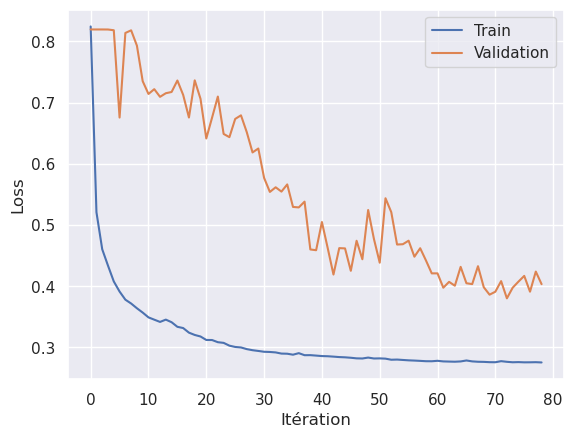

In [34]:
plt.plot(result_2.index[start:], result_2["loss"][start:])
plt.plot(result_2.index[start:], result_2["val_loss"][start:])
plt.xlabel('Itération')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'], loc='best')
plt.show()
#plt.plot(result.index, result["dice_coeff"])


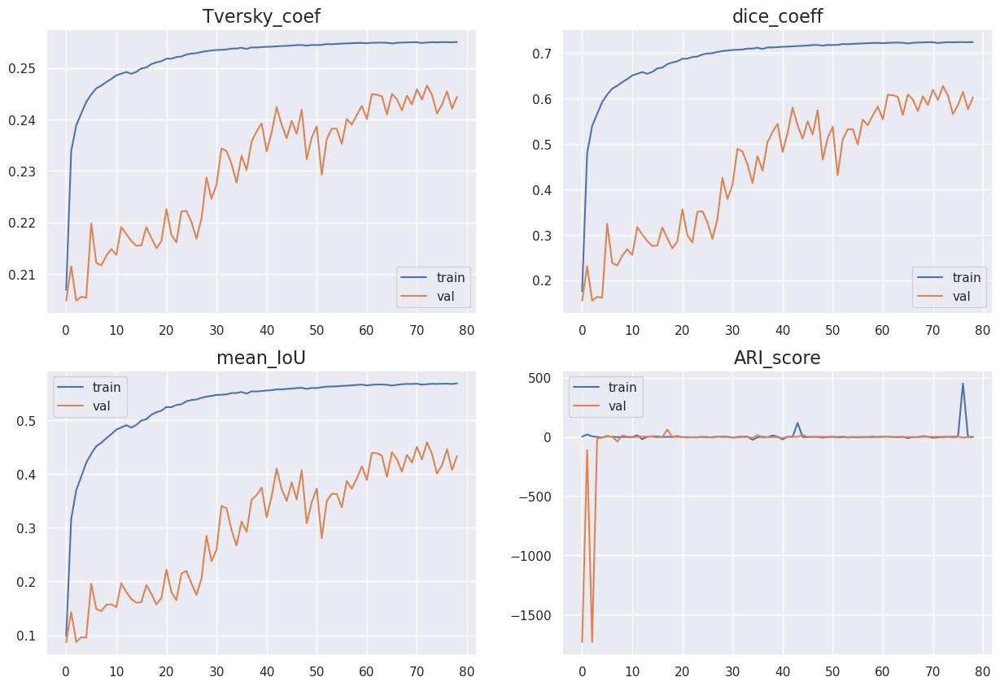

In [35]:
afficher_les_metriques( result_2 )

In [36]:
img_gen = MyImagesGenerator( chemin_image, chemin_masque_labelIds,10, True, augmentation=aug_2, taille_des_donnees = 30 , target_size=img_res)

img, mask = img_gen.__getitem__(0)

In [37]:
img.shape

(10, 128, 256, 3)

In [38]:
mask.shape

(10, 128, 256, 8)

In [39]:
mask_pred = model_2.predict(img)

1/1 [==============================] - 2s 2s/step


In [40]:
mask_pred.shape

(10, 128, 256, 8)

In [41]:
transformer = Mask_To_8_Groups()

In [42]:
mask_pred = [ transformer.invers_transform(i) for i in mask_pred]

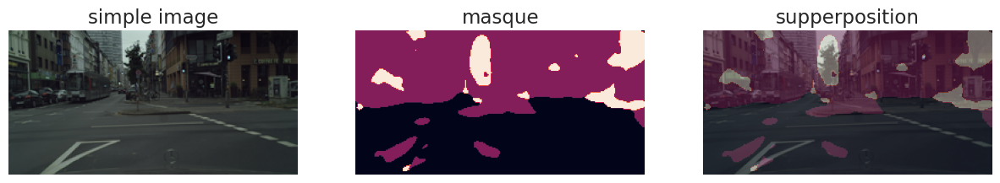

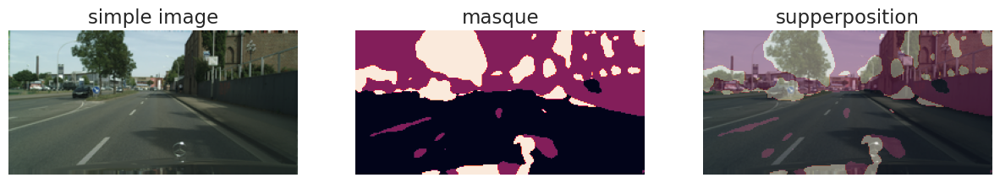

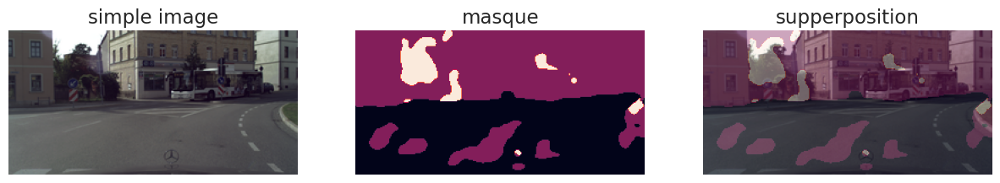

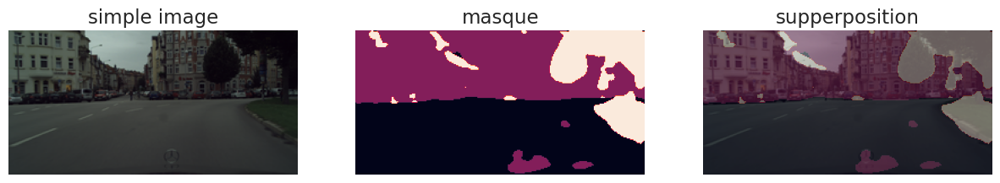

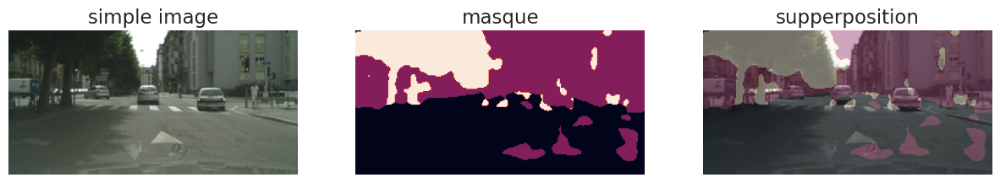

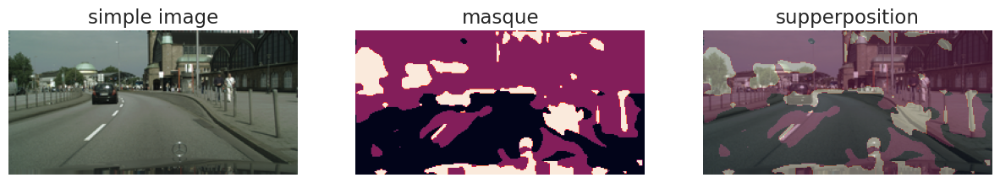

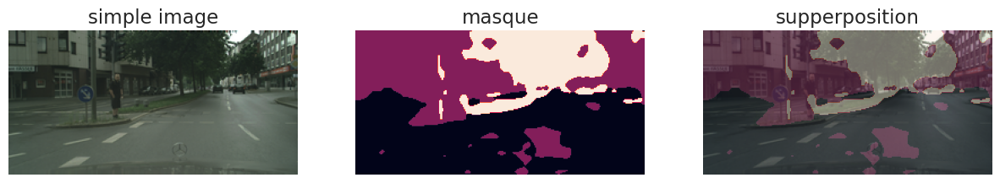

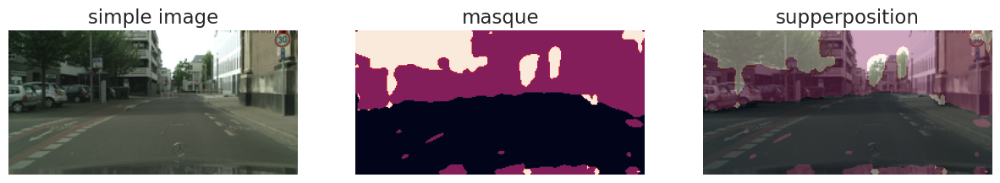

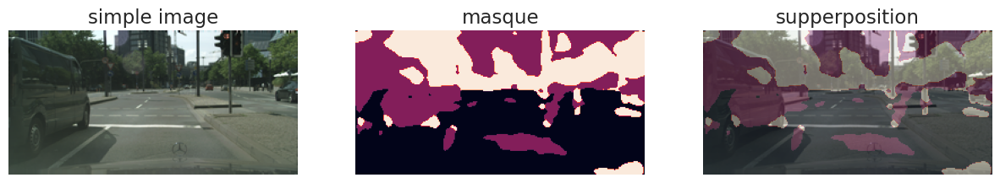

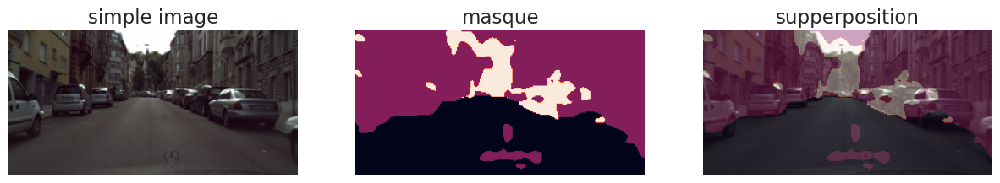

In [43]:
for i in range(10) :
    afficher_les_images_supperposees(img[i], mask_pred[i], style=3)

# <strong> C - Sans augmentation de données avec fonction perte de type categorical_focal_loss

In [44]:
#resolution des images et masques
aug_3 = False
perte_3 = "categorical_focal_loss"
img_res = (128,256,3)

In [45]:
model_3 = TL_unet_model( img_res , 8)

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 128, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 block1_conv1 (Conv2D)          (None, 128, 256, 64  1792        ['input_3[0][0]']                
                                )                                                                 
                                                                                                  
 block1_conv2 (Conv2D)          (None, 128, 256, 64  36928       ['block1_conv1[0][0]']           
                                )                                                           

In [46]:
# binary_crossentropy, categorical_crossentropy, sparse_categorical_crossentropy

model_3.compile(optimizer = Adam(lr = 2.e-2),
                loss = categorical_focal_loss ,
                metrics = [ARI_score, mean_IoU,dice_coeff, Tversky_coef ],
                run_eagerly=True 
               )  

##################################################
###########     POINTS DE CONTROLE     ###########
checkpoint_path_3 = f"models/{model_name}_Loss={perte_3}_aug={aug_3}_/cp.ckpt"
checkpoint_dir_3 = os.path.dirname(checkpoint_path_3)


#############################################
###########     MES CALBACKS     ############
# Seuil de convergence
my_callback = MyCallback(0.95)
# Update du learning rate
learning_rate_callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
# Sauvegarde des poids du modèle
cp_callback_3 = tf.keras.callbacks.ModelCheckpoint(filepath = checkpoint_path_3,
                                                   save_weights_only = True,
                                                   verbose = 1,
                                                   save_freq = 125
                                                  )
early_stopping_3 = tf.keras.callbacks.EarlyStopping(
                                                    monitor='loss',
                                                    min_delta=0.001,
                                                    patience=10,
                                                    verbose= 1,
                                                    mode='min',
                                                    baseline=None,
                                                    restore_best_weights=True
                                                    )

###################################################
###############                     ###############
MyImagesGenerator.nombre_d_instances = 0
charger_les_poids_3 = False

In [47]:
if charger_les_poids_3 :
    model_3.load_weights(checkpoint_path_3)
    

history_3 = model_3.fit_generator( 
    generator= MyImagesGenerator(chemin_image, chemin_masque_labelIds,25, True, augmentation=aug_3, taille_des_donnees= 50, target_size=img_res),
    validation_data= MyImagesGenerator(chemin_image, chemin_masque_labelIds,5, True, augmentation=aug_3, taille_des_donnees= 20, target_size=img_res),
    epochs= 450,
    callbacks = [ my_callback, learning_rate_callback, cp_callback_3, early_stopping_3 ],
    max_queue_size=12,
    use_multiprocessing= False
)
# Sauvegarde complète du modèle
model_3.save(checkpoint_dir_3+f"/Complete_model_date={datetime.today().strftime('%Y_%m_%d-%Hh%Mmin%Ssec')}.h5")

Epoch 1/450
2/2 [==============================] - 38s 19s/step - loss: 0.0599 - ARI_score: 2.8140 - mean_IoU: 0.1065 - dice_coeff: 0.1885 - Tversky_coef: 0.2081 - val_loss: 0.4628 - val_ARI_score: -1.2092 - val_mean_IoU: 0.0380 - val_dice_coeff: 0.0731 - val_Tversky_coef: 0.1976 - lr: 0.0200
Epoch 2/450
2/2 [==============================] - 35s 18s/step - loss: 0.0382 - ARI_score: 2.0062 - mean_IoU: 0.1854 - dice_coeff: 0.3119 - Tversky_coef: 0.2196 - val_loss: 0.3030 - val_ARI_score: -3.6768 - val_mean_IoU: 0.2482 - val_dice_coeff: 0.3975 - val_Tversky_coef: 0.2262 - lr: 0.0200
Epoch 3/450
2/2 [==============================] - 35s 18s/step - loss: 0.0301 - ARI_score: 2.0008 - mean_IoU: 0.1972 - dice_coeff: 0.3291 - Tversky_coef: 0.2212 - val_loss: 0.3841 - val_ARI_score: -0.2476 - val_mean_IoU: 0.1337 - val_dice_coeff: 0.2355 - val_Tversky_coef: 0.2119 - lr: 0.0200
Epoch 4/450
2/2 [==============================] - 35s 19s/step - loss: 0.0262 - ARI_score: 2.0002 - mean_IoU: 0.2302 

In [48]:
result_3  = pd.DataFrame( history_3.history )
result_3.drop(["lr"], axis = 1, inplace = True)
result_3["modèle"] = [model_name for _ in range( result_3.shape[0])]
result_3["Loss"] = [perte_3 for _ in range( result_3.shape[0])]
result_3["Augmentation"] = [aug_3 for _ in range( result_3.shape[0])]
result_3.to_csv(f"{model_name}_loss={perte_3}_augment={aug_3}_date={datetime.today().strftime('%Y_%m_%d-%Hh%Mmin%Ssec')}.csv", index=False)
result_3

,loss,ARI_score,mean_IoU,dice_coeff,Tversky_coef,val_loss,val_ARI_score,val_mean_IoU,val_dice_coeff,val_Tversky_coef,modèle,Loss,Augmentation
0,0.059938,2.813996,0.106469,0.188482,0.208143,0.462821,-1.209212,0.037951,0.073094,0.197569,Transfert_learning_UNET+512-32,categorical_focal_loss,False
1,0.038246,2.006209,0.185396,0.311928,0.219563,0.303048,-3.676764,0.248222,0.397523,0.226231,Transfert_learning_UNET+512-32,categorical_focal_loss,False
2,0.030069,2.000755,0.197160,0.329066,0.221163,0.384085,-0.247587,0.133655,0.235485,0.211918,Transfert_learning_UNET+512-32,categorical_focal_loss,False
3,0.026156,2.000158,0.230183,0.374225,0.225240,0.363052,0.584684,0.146612,0.255402,0.213695,Transfert_learning_UNET+512-32,categorical_focal_loss,False
4,0.024375,2.000280,0.241304,0.388775,0.226595,0.425868,-0.731011,0.079547,0.147233,0.204123,Transfert_learning_UNET+512-32,categorical_focal_loss,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...
59,0.008279,2.000702,0.516508,0.681144,0.252429,0.040931,1.998719,0.286600,0.444543,0.231256,Transfert_learning_UNET+512-32,categorical_focal_loss,False
60,0.008309,2.000138,0.502080,0.668444,0.251382,0.111753,1.998720,0.182564,0.308697,0.218744,Transfert_learning_UNET+512-32,categorical_focal_loss,False
61,0.008017,2.001988,0.514432,0.679355,0.252310,0.034733,1.998719,0.304611,0.465737,0.233218,Transfert_learning_UNET+512-32,categorical_focal_loss,False
62,0.007774,2.000149,0.503202,0.669504,0.251504,0.100062,1.982526,0.187863,0.315164,0.219389,Transfert_learning_UNET+512-32,categorical_focal_loss,False


In [49]:
start = 3

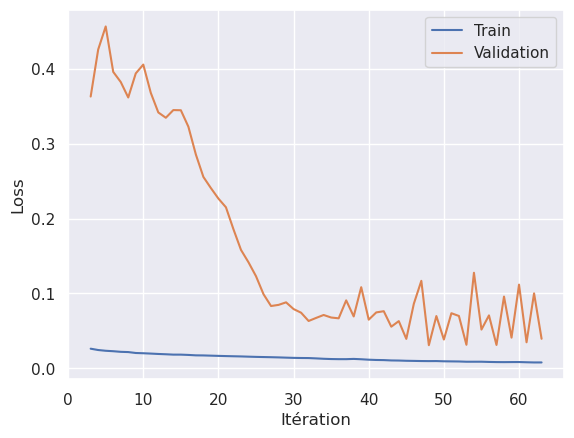

In [50]:
plt.plot(result_3.index[start:], result_3["loss"][start:])
plt.plot(result_3.index[start:], result_3["val_loss"][start:])
plt.xlabel('Itération')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'], loc='best')
plt.show()
#plt.plot(result.index, result["dice_coeff"])


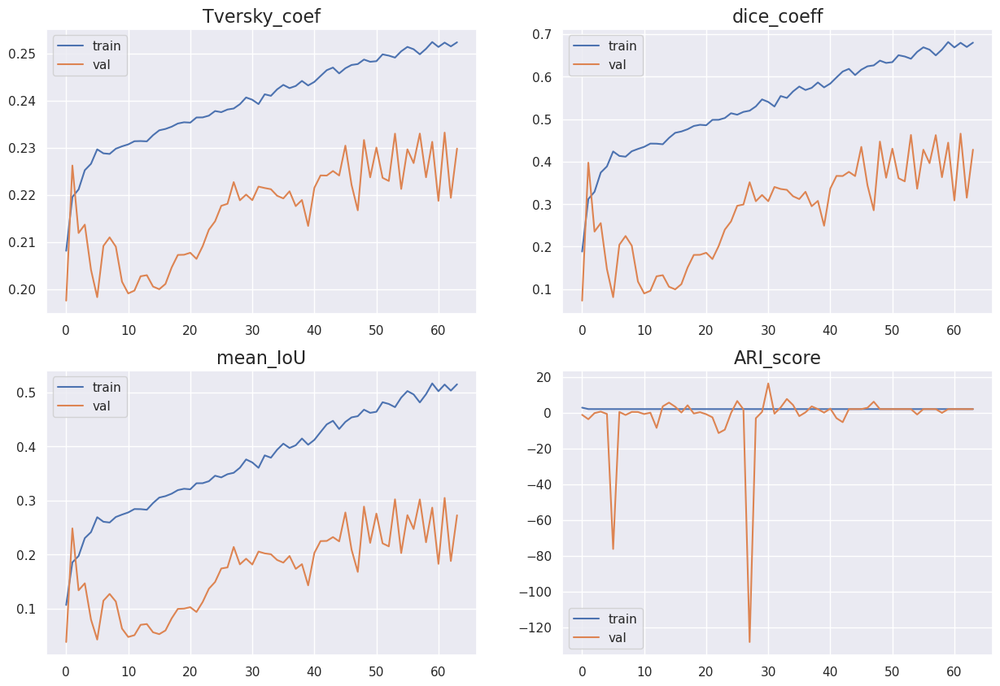

In [51]:
afficher_les_metriques( result_3 )

In [52]:
img_gen = MyImagesGenerator( chemin_image, chemin_masque_labelIds,10, True, augmentation=aug_3, taille_des_donnees = 30 , target_size=img_res)

img, mask = img_gen.__getitem__(0)

In [53]:
img.shape

(10, 128, 256, 3)

In [54]:
mask.shape

(10, 128, 256, 8)

In [55]:
mask_pred = model_3.predict(img)

1/1 [==============================] - 1s 1s/step


In [56]:
mask_pred.shape

(10, 128, 256, 8)

In [57]:
transformer = Mask_To_8_Groups()

In [58]:
mask_pred = [ transformer.invers_transform(i) for i in mask_pred]

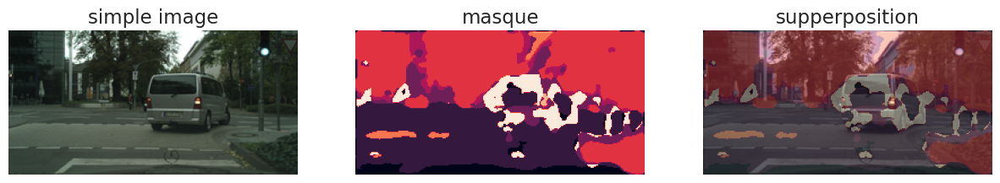

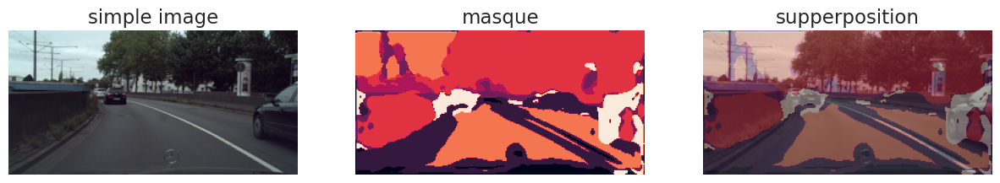

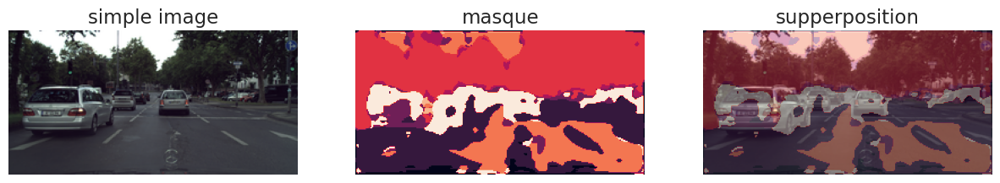

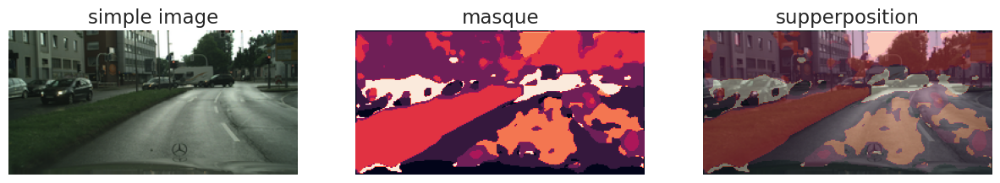

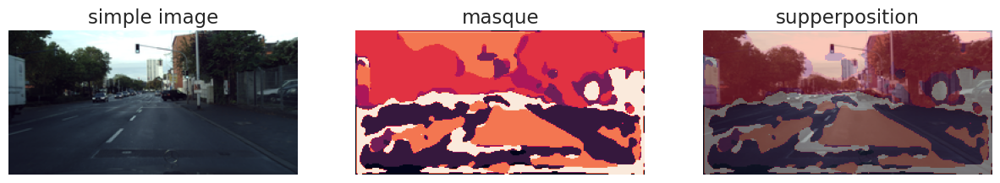

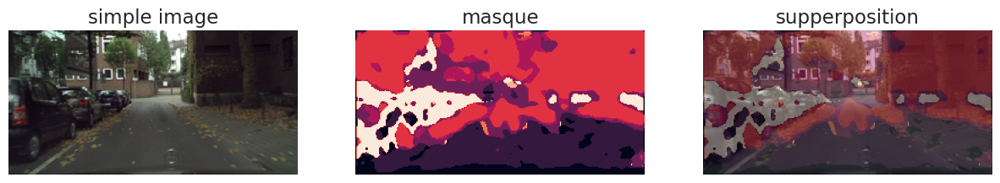

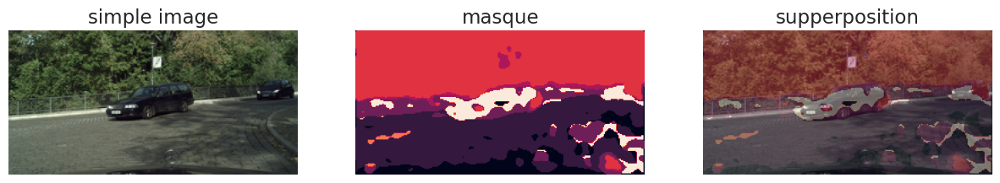

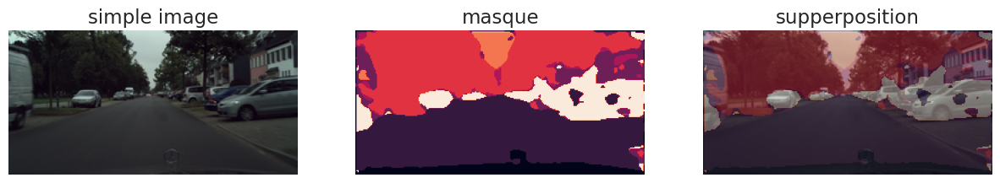

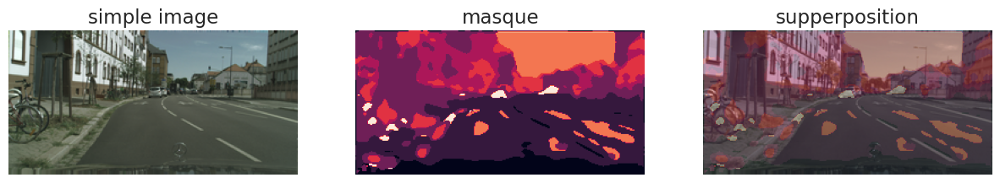

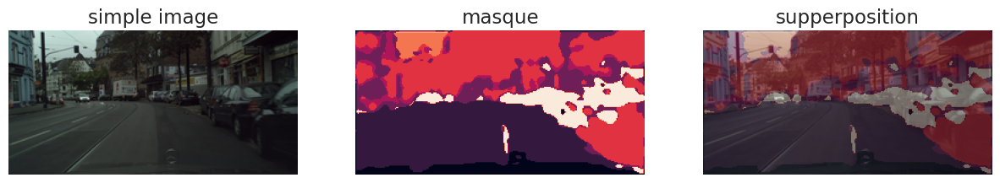

In [59]:
for i in range(10) :
    afficher_les_images_supperposees(img[i], mask_pred[i], style=3)

# <strong> D - Sans augmentation de données avec fonction perte de type categorical_focal_jaccard_loss

In [60]:
#resolution des images et masques
aug_4 = False
perte_4 = "categorical_focal_jaccard_loss"
img_res = (128,256,3)

In [61]:
model_4 = TL_unet_model( img_res , 8)

Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_4 (InputLayer)           [(None, 128, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 block1_conv1 (Conv2D)          (None, 128, 256, 64  1792        ['input_4[0][0]']                
                                )                                                                 
                                                                                                  
 block1_conv2 (Conv2D)          (None, 128, 256, 64  36928       ['block1_conv1[0][0]']           
                                )                                                           

In [62]:
# binary_crossentropy, categorical_crossentropy, sparse_categorical_crossentropy

model_4.compile(optimizer = Adam(lr = 2.e-2 ),
                loss = categorical_focal_jaccard_loss ,
                metrics = [ARI_score, mean_IoU, dice_coeff, Tversky_coef ],
                run_eagerly=True
               )  

##################################################
###########     POINTS DE CONTROLE     ###########
checkpoint_path_4 = f"models/{model_name}_Loss={perte_4}_aug={aug_4}_/cp.ckpt"
checkpoint_dir_4 = os.path.dirname(checkpoint_path_4)


#############################################
###########     MES CALBACKS     ############
# Seuil de convergence
my_callback = MyCallback(0.95)
# Update du learning rate
learning_rate_callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
# Sauvegarde des poids du modèle
cp_callback_4 = tf.keras.callbacks.ModelCheckpoint(filepath = checkpoint_path_4,
                                                   save_weights_only = True,
                                                   verbose = 1,
                                                   save_freq = 125
                                                  )
early_stopping_4 = tf.keras.callbacks.EarlyStopping(
                                                    monitor='loss',
                                                    min_delta=0.001,
                                                    patience=15,
                                                    verbose= 1,
                                                    mode='min',
                                                    baseline=None,
                                                    restore_best_weights=True
                                                    )

###################################################
###############                     ###############
MyImagesGenerator.nombre_d_instances = 0
charger_les_poids_4 = False

In [63]:
if charger_les_poids_4  :
    model_4.load_weights(checkpoint_path_4)
    
    
history_4 = model_4.fit_generator( 
    generator= MyImagesGenerator(chemin_image, chemin_masque_labelIds,25, True, augmentation=aug_4, taille_des_donnees= 50, target_size=img_res),
    validation_data= MyImagesGenerator(chemin_image, chemin_masque_labelIds,5, True, augmentation=aug_4, taille_des_donnees= 15, target_size=img_res),
    epochs= 450,
    callbacks = [ my_callback, learning_rate_callback, cp_callback_4, early_stopping_4 ] ,
    max_queue_size=12,
    use_multiprocessing= False
)
# Sauvegarde complète du modèle
model_4.save(checkpoint_dir_4+f"/Complete_model_date={datetime.today().strftime('%Y_%m_%d-%Hh%Mmin%Ssec')}.h5")

Epoch 1/450
2/2 [==============================] - 35s 19s/step - loss: 0.9969 - ARI_score: 6.0193 - mean_IoU: 0.1040 - dice_coeff: 0.1853 - Tversky_coef: 0.2078 - val_loss: 1.3842 - val_ARI_score: -3.5327 - val_mean_IoU: 0.1050 - val_dice_coeff: 0.1892 - val_Tversky_coef: 0.2077 - lr: 0.0200
Epoch 2/450
2/2 [==============================] - 34s 17s/step - loss: 0.9179 - ARI_score: 3.9707 - mean_IoU: 0.2851 - dice_coeff: 0.4432 - Tversky_coef: 0.2308 - val_loss: 1.3775 - val_ARI_score: 3.3699 - val_mean_IoU: 0.1055 - val_dice_coeff: 0.1893 - val_Tversky_coef: 0.2077 - lr: 0.0200
Epoch 3/450
2/2 [==============================] - 34s 17s/step - loss: 0.8389 - ARI_score: 1.9906 - mean_IoU: 0.3198 - dice_coeff: 0.4846 - Tversky_coef: 0.2344 - val_loss: 1.3666 - val_ARI_score: 0.0256 - val_mean_IoU: 0.1107 - val_dice_coeff: 0.1978 - val_Tversky_coef: 0.2084 - lr: 0.0200
Epoch 4/450
2/2 [==============================] - 34s 17s/step - loss: 0.8029 - ARI_score: 3.2650 - mean_IoU: 0.3422 - 

In [64]:
result_4  = pd.DataFrame( history_4.history )
result_4.drop(["lr"], axis = 1, inplace = True)
result_4["modèle"] = [model_name for _ in range( result_4.shape[0])]
result_4["Loss"] = [perte_4 for _ in range( result_4.shape[0])]
result_4["Augmentation"] = [aug_4 for _ in range( result_4.shape[0])]
result_4.to_csv(f"{model_name}_loss={perte_4}_augment={aug_4}_date={datetime.today().strftime('%Y_%m_%d-%Hh%Mmin%Ssec')}.csv", index=False)
result_4

,loss,ARI_score,mean_IoU,dice_coeff,Tversky_coef,val_loss,val_ARI_score,val_mean_IoU,val_dice_coeff,val_Tversky_coef,modèle,Loss,Augmentation
0,0.996865,6.019277,0.103963,0.185349,0.207807,1.384184,-3.532737,0.105013,0.189152,0.207659,Transfert_learning_UNET+512-32,categorical_focal_jaccard_loss,False
1,0.917851,3.970662,0.285086,0.443151,0.230769,1.377506,3.369856,0.105497,0.189341,0.207675,Transfert_learning_UNET+512-32,categorical_focal_jaccard_loss,False
2,0.838914,1.990610,0.319821,0.484628,0.234419,1.366642,0.025619,0.110739,0.197830,0.208425,Transfert_learning_UNET+512-32,categorical_focal_jaccard_loss,False
3,0.802930,3.265033,0.342157,0.509297,0.236825,1.361580,-0.069001,0.112283,0.201364,0.208738,Transfert_learning_UNET+512-32,categorical_focal_jaccard_loss,False
4,0.776458,0.707418,0.398927,0.570333,0.241951,1.360351,-0.724193,0.112558,0.201942,0.208789,Transfert_learning_UNET+512-32,categorical_focal_jaccard_loss,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...
181,0.223743,26.080551,0.869568,0.930229,0.273185,0.542843,-0.029004,0.668890,0.801550,0.261808,Transfert_learning_UNET+512-32,categorical_focal_jaccard_loss,False
182,0.220859,-4.991371,0.874457,0.933025,0.273428,0.547919,-5.894499,0.684301,0.811178,0.262635,Transfert_learning_UNET+512-32,categorical_focal_jaccard_loss,False
183,0.215987,-2.967222,0.874597,0.933103,0.273429,0.560332,-4.867890,0.661064,0.795693,0.261291,Transfert_learning_UNET+512-32,categorical_focal_jaccard_loss,False
184,0.225194,-0.574127,0.870716,0.930862,0.273242,0.582472,-1.471298,0.649049,0.786358,0.260448,Transfert_learning_UNET+512-32,categorical_focal_jaccard_loss,False


In [65]:
start = 0

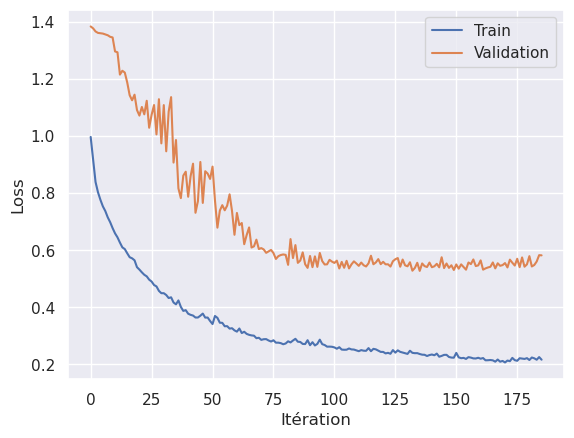

In [66]:
plt.plot(result_4.index[start:], result_4["loss"][start:])
plt.plot(result_4.index[start:], result_4["val_loss"][start:])
plt.xlabel('Itération')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'], loc='best')
plt.show()
#plt.plot(result.index, result["dice_coeff"])


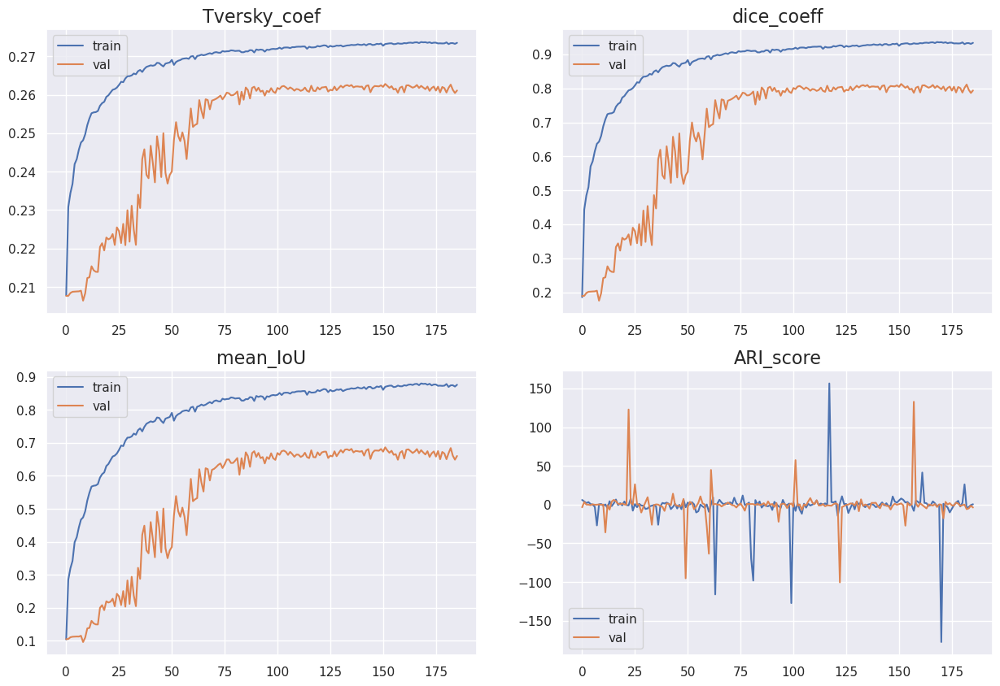

In [67]:
afficher_les_metriques( result_4 )

In [68]:
img_gen = MyImagesGenerator( chemin_image, chemin_masque_labelIds,10, False, augmentation=aug_4, taille_des_donnees = 30 , target_size=img_res)

img, mask = img_gen.__getitem__(0)

In [69]:
img.shape

(10, 128, 256, 3)

In [70]:
mask.shape

(10, 128, 256, 8)

In [71]:
mask_pred = model_4.predict(img)

1/1 [==============================] - 2s 2s/step


In [72]:
mask_pred.shape

(10, 128, 256, 8)

In [73]:
transformer = Mask_To_8_Groups()

In [74]:
mask_pred = [ transformer.invers_transform(i) for i in mask_pred]

In [75]:
np.unique( mask_pred )

array([0, 1, 2, 3, 4, 5, 6, 7])

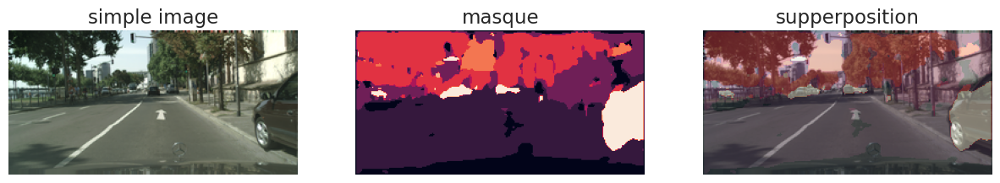

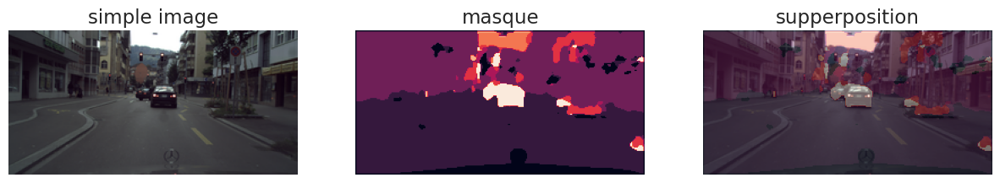

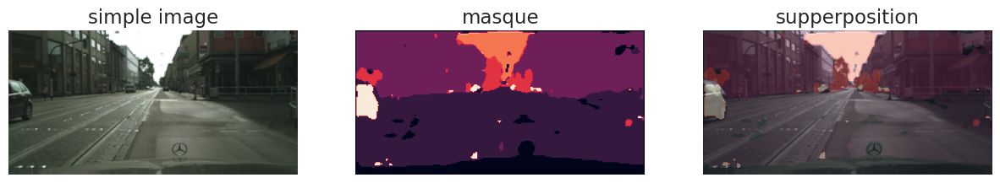

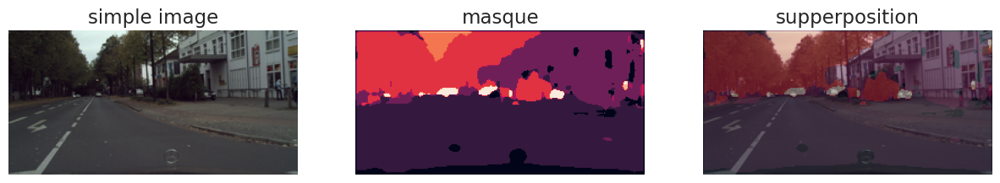

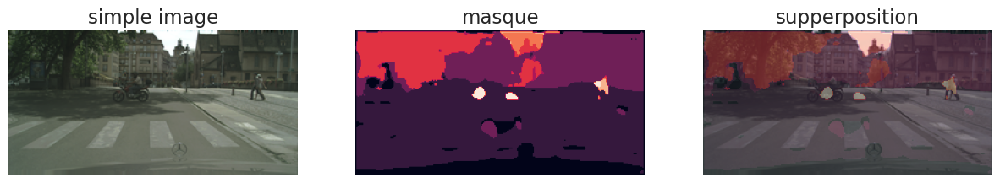

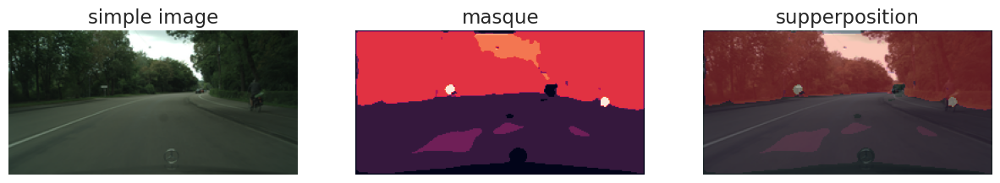

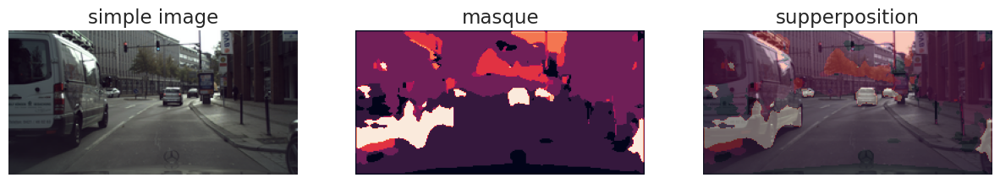

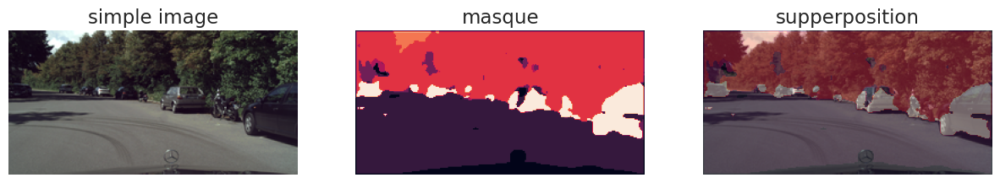

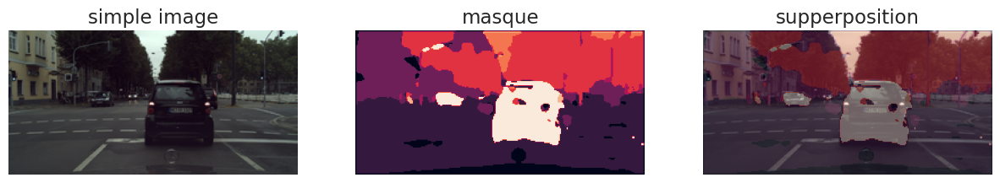

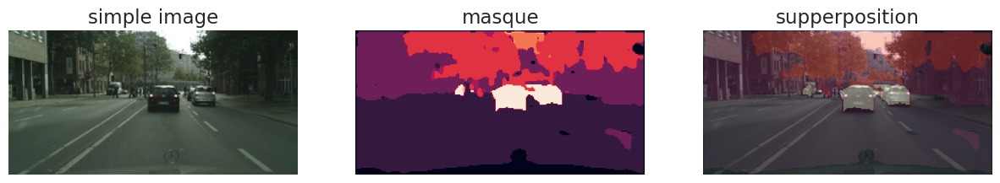

In [76]:
for i in range(10) :
    afficher_les_images_supperposees(img[i], mask_pred[i], style=3)

In [77]:
result_1.iloc[-50:,:].max().values

array([0.3291015326976776, 9.780491828918457, 0.8422729969024658,
       0.9143832921981812, 0.27182841300964355, 0.5786712765693665,
       103.48997497558594, 0.6999339461326599, 0.8234295845031738,
       0.2638002038002014, 'Transfert_learning_UNET+512-32',
       'jaccard_loss', False], dtype=object)

In [78]:
recap = pd.DataFrame([result_1.iloc[-70:,:].max().values , 
              result_2.iloc[-70:,:].max().values,
              result_3.iloc[-70:,:].max().values, 
              result_4.iloc[-70:,:].max().values],
             columns= result_1.keys()
            ).drop(["loss","ARI_score","val_ARI_score","val_loss"], axis = 1)

recap

,mean_IoU,dice_coeff,Tversky_coef,val_mean_IoU,val_dice_coeff,val_Tversky_coef,modèle,Loss,Augmentation
0,0.842273,0.914383,0.271828,0.699934,0.823430,0.263800,Transfert_learning_UNET+512-32,jaccard_loss,False
1,0.568702,0.724629,0.255021,0.459231,0.627754,0.246580,Transfert_learning_UNET+512-32,dice_loss,False
2,0.516508,0.681144,0.252429,0.304611,0.465737,0.233218,Transfert_learning_UNET+512-32,categorical_focal_loss,False
3,0.880238,0.936301,0.273713,0.686438,0.812918,0.262808,Transfert_learning_UNET+512-32,categorical_focal_jaccard_loss,False


In [79]:
recap.style.highlight_min(axis=0, color='red').highlight_max(axis=0, color='green')

,mean_IoU,dice_coeff,Tversky_coef,val_mean_IoU,val_dice_coeff,val_Tversky_coef,modèle,Loss,Augmentation
0,0.842273,0.914383,0.271828,0.699934,0.823430,0.263800,Transfert_learning_UNET+512-32,jaccard_loss,False
1,0.568702,0.724629,0.255021,0.459231,0.627754,0.246580,Transfert_learning_UNET+512-32,dice_loss,False
2,0.516508,0.681144,0.252429,0.304611,0.465737,0.233218,Transfert_learning_UNET+512-32,categorical_focal_loss,False
3,0.880238,0.936301,0.273713,0.686438,0.812918,0.262808,Transfert_learning_UNET+512-32,categorical_focal_jaccard_loss,False


In [80]:
#if "recap.csv" in os.listdir() : 
#    x = pd.read_csv("recep.csv")
#    recap = pd.concat([x , recap], axis = 0, ignore_index=True)
#    recap.drop_duplicates(["modèle","Loss","Augmentation"], inplace=True)

recap.to_csv(f"recap_{model_name}.csv", index = False )


# <strong> E - Sans augmentation de données avec fonction perte de type categorical_focal_dice_loss

In [12]:
#resolution des images et masques
aug_5 = False
perte_5 = "categorical_focal_dice_loss"
img_res = (128,256,3)

In [13]:
model_5 = TL_unet_model( img_res , 8)

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 128, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 block1_conv1 (Conv2D)          (None, 128, 256, 64  1792        ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 block1_conv2 (Conv2D)          (None, 128, 256, 64  36928       ['block1_conv1[0][0]']           
                                )                                                             

In [14]:
# binary_crossentropy, categorical_crossentropy, sparse_categorical_crossentropy

model_5.compile(optimizer = Adam(lr = 2.e-2 ),
                loss = categorical_focal_dice_loss ,
                metrics = [ARI_score, mean_IoU, dice_coeff, Tversky_coef ],
                run_eagerly=True
               )  

##################################################
###########     POINTS DE CONTROLE     ###########
checkpoint_path_5 = f"models/{model_name}_Loss={perte_5}_aug={aug_5}_/cp.ckpt"
checkpoint_dir_5 = os.path.dirname(checkpoint_path_5)


#############################################
###########     MES CALBACKS     ############
# Seuil de convergence
my_callback = MyCallback(0.95)
# Update du learning rate
learning_rate_callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
# Sauvegarde des poids du modèle
cp_callback_5 = tf.keras.callbacks.ModelCheckpoint(filepath = checkpoint_path_5,
                                                   save_weights_only = True,
                                                   verbose = 1,
                                                   save_freq = 25
                                                  )
early_stopping_5 = tf.keras.callbacks.EarlyStopping(
                                                    monitor='loss',
                                                    min_delta=0.001,
                                                    patience=15,
                                                    verbose= 1,
                                                    mode='min',
                                                    baseline=None,
                                                    restore_best_weights=True
                                                    )

###################################################
###############                     ###############
MyImagesGenerator.nombre_d_instances = 0
charger_les_poids_5 = False

In [15]:
if charger_les_poids_5  :
    model_5.load_weights(checkpoint_path_5)
    
    
history_5 = model_5.fit_generator( 
    generator= MyImagesGenerator(chemin_image, chemin_masque_labelIds,25, True, augmentation=aug_5, taille_des_donnees= 50, target_size=img_res),
    validation_data= MyImagesGenerator(chemin_image, chemin_masque_labelIds,5, True, augmentation=aug_5, taille_des_donnees= 15, target_size=img_res),
    epochs= 450,
    callbacks = [ my_callback, learning_rate_callback, cp_callback_5, early_stopping_5 ] ,
    max_queue_size=12,
    use_multiprocessing= False
)
# Sauvegarde complète du modèle
model_5.save(checkpoint_dir_5+f"/Complete_model_date={datetime.today().strftime('%Y_%m_%d-%Hh%Mmin%Ssec')}.h5")

Epoch 1/450
2/2 [==============================] - 41s 23s/step - loss: 0.3940 - ARI_score: 1.5163 - mean_IoU: 0.6553 - dice_coeff: 0.7917 - Tversky_coef: 0.2611 - val_loss: 0.6631 - val_ARI_score: 3.4048 - val_mean_IoU: 0.4526 - val_dice_coeff: 0.6227 - val_Tversky_coef: 0.2461 - lr: 0.0268
Epoch 2/450
2/2 [==============================] - 40s 20s/step - loss: 0.3629 - ARI_score: 0.9681 - mean_IoU: 0.6738 - dice_coeff: 0.8050 - Tversky_coef: 0.2623 - val_loss: 0.7066 - val_ARI_score: 11.2372 - val_mean_IoU: 0.4164 - val_dice_coeff: 0.5856 - val_Tversky_coef: 0.2428 - lr: 0.0268
Epoch 3/450
2/2 [==============================] - 32s 16s/step - loss: 0.3386 - ARI_score: 0.9986 - mean_IoU: 0.6927 - dice_coeff: 0.8184 - Tversky_coef: 0.2635 - val_loss: 0.6211 - val_ARI_score: -0.5148 - val_mean_IoU: 0.4979 - val_dice_coeff: 0.6645 - val_Tversky_coef: 0.2497 - lr: 0.0268
Epoch 4/450
2/2 [==============================] - 32s 16s/step - loss: 0.3179 - ARI_score: 1.3600 - mean_IoU: 0.7074 -

In [16]:
result_5  = pd.DataFrame( history_5.history )
result_5.drop(["lr"], axis = 1, inplace = True)
result_5["modèle"] = [model_name for _ in range( result_5.shape[0])]
result_5["Loss"] = [perte_5 for _ in range( result_5.shape[0])]
result_5["Augmentation"] = [aug_5 for _ in range( result_5.shape[0])]
result_5.to_csv(f"{model_name}_loss={perte_5}_augment={aug_5}_date={datetime.today().strftime('%Y_%m_%d-%Hh%Mmin%Ssec')}.csv", index=False)
result_5

,loss,ARI_score,mean_IoU,dice_coeff,Tversky_coef,val_loss,val_ARI_score,val_mean_IoU,val_dice_coeff,val_Tversky_coef,modèle,Loss,Augmentation
0,0.394032,1.516255,0.655254,0.791726,0.261108,0.663129,3.404752,0.452607,0.622667,0.246056,Transfert_learning_UNET+512-32,categorical_focal_dice_loss,False
1,0.362908,0.968143,0.673826,0.805006,0.262295,0.706563,11.237198,0.416386,0.585602,0.242788,Transfert_learning_UNET+512-32,categorical_focal_dice_loss,False
2,0.338612,0.998612,0.692674,0.818402,0.263488,0.621106,-0.514770,0.497853,0.664480,0.249742,Transfert_learning_UNET+512-32,categorical_focal_dice_loss,False
3,0.317877,1.360049,0.707398,0.828626,0.264415,0.664980,2.673939,0.458624,0.628428,0.246583,Transfert_learning_UNET+512-32,categorical_focal_dice_loss,False
4,0.306498,0.205926,0.715190,0.833940,0.264880,0.640756,0.380311,0.469241,0.636844,0.247323,Transfert_learning_UNET+512-32,categorical_focal_dice_loss,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...
94,0.157793,-0.338898,0.860436,0.924963,0.272819,0.498158,1.047536,0.597191,0.747793,0.257124,Transfert_learning_UNET+512-32,categorical_focal_dice_loss,False
95,0.159974,3.288239,0.860863,0.925227,0.272842,0.451364,-2.506606,0.610288,0.757953,0.258035,Transfert_learning_UNET+512-32,categorical_focal_dice_loss,False
96,0.151292,1.601522,0.863331,0.926646,0.272972,0.459870,6.810967,0.613857,0.760309,0.258238,Transfert_learning_UNET+512-32,categorical_focal_dice_loss,False
97,0.158366,1.994490,0.860899,0.925156,0.272835,0.456955,-10.022449,0.599059,0.745033,0.256902,Transfert_learning_UNET+512-32,categorical_focal_dice_loss,False


In [17]:
start = 0

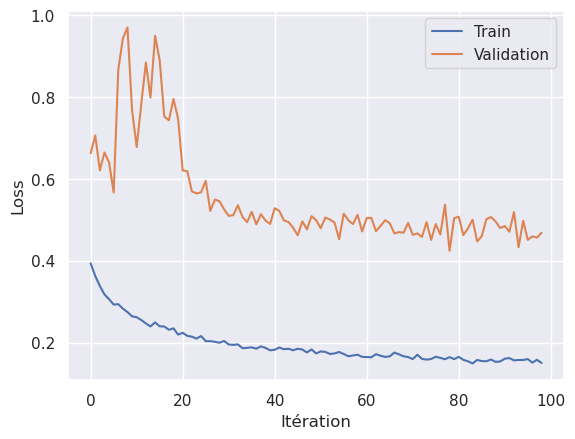

In [18]:
plt.plot(result_5.index[start:], result_5["loss"][start:])
plt.plot(result_5.index[start:], result_5["val_loss"][start:])
plt.xlabel('Itération')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'], loc='best')
plt.show()
#plt.plot(result.index, result["dice_coeff"])


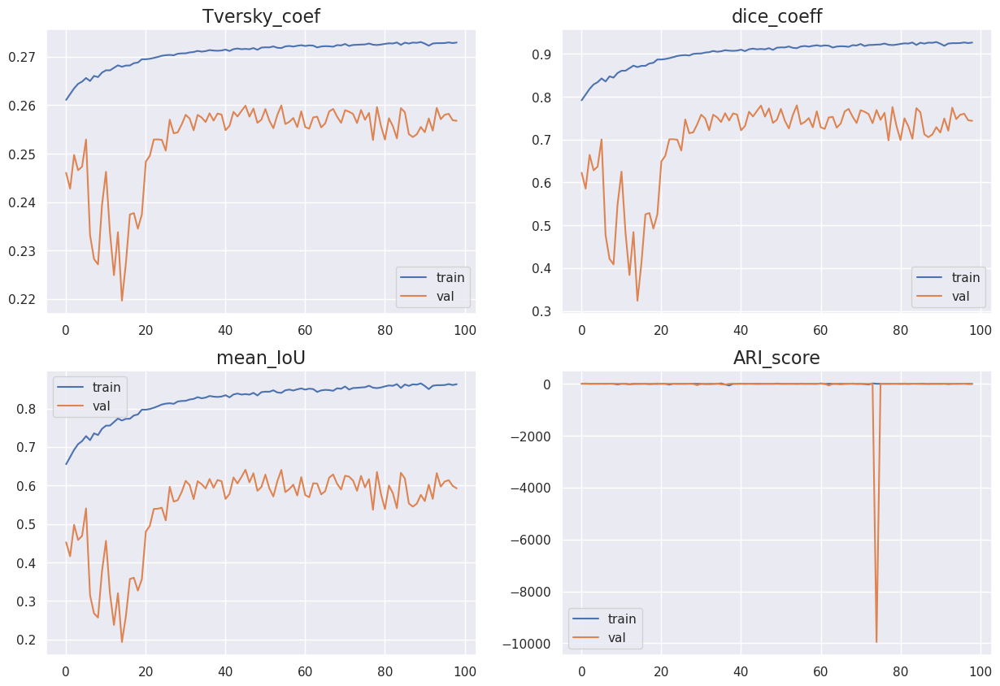

In [19]:
afficher_les_metriques( result_5 )

In [20]:
img_gen = MyImagesGenerator( chemin_image, chemin_masque_labelIds,10, False, augmentation=aug_5, taille_des_donnees = 30 , target_size=img_res)

img, mask = img_gen.__getitem__(0)

In [21]:
img.shape

(10, 128, 256, 3)

In [22]:
mask.shape

(10, 128, 256, 8)

In [23]:
mask_pred = model_5.predict(img)

1/1 [==============================] - 2s 2s/step


In [24]:
mask_pred.shape

(10, 128, 256, 8)

In [25]:
transformer = Mask_To_8_Groups()

In [26]:
mask_pred = [ transformer.invers_transform(i) for i in mask_pred]

In [27]:
np.unique( mask_pred )

array([0, 1, 2, 3, 4, 5, 6, 7])

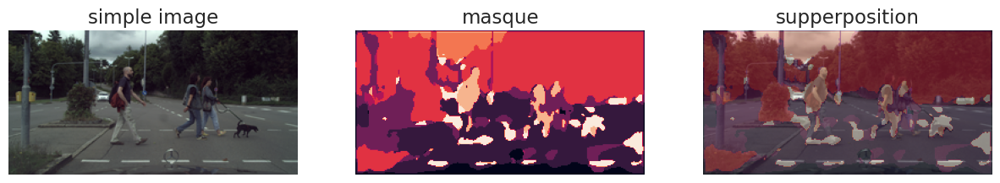

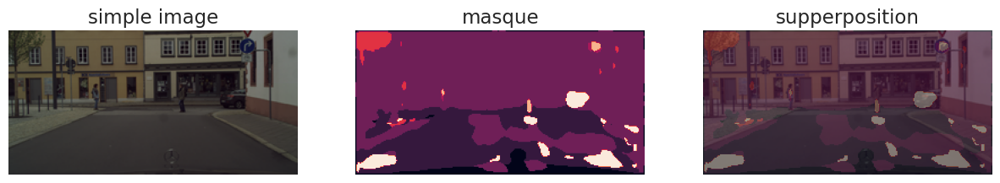

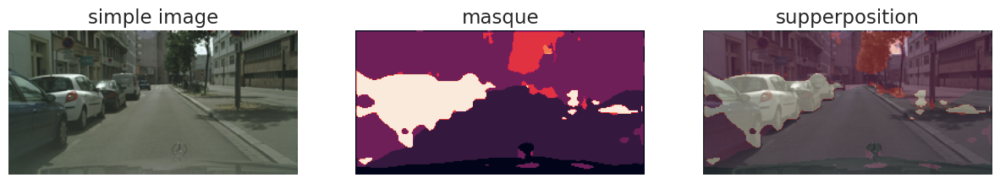

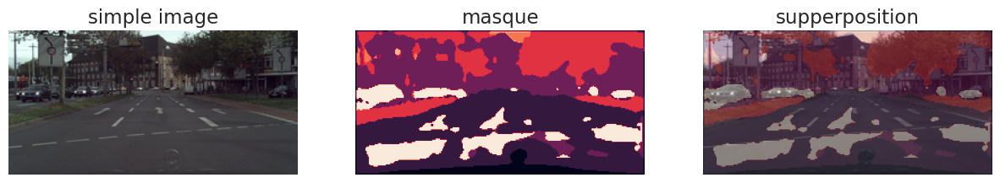

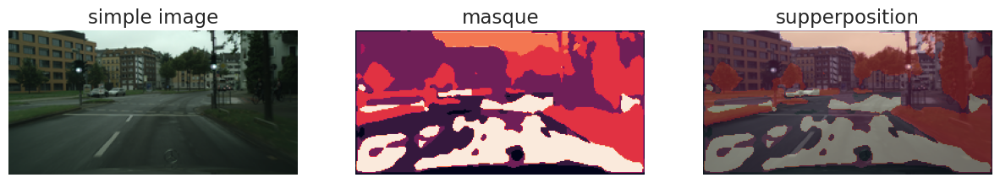

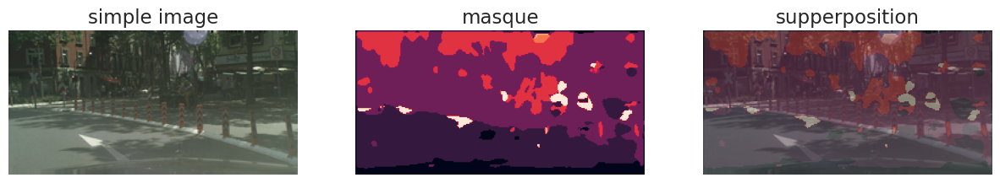

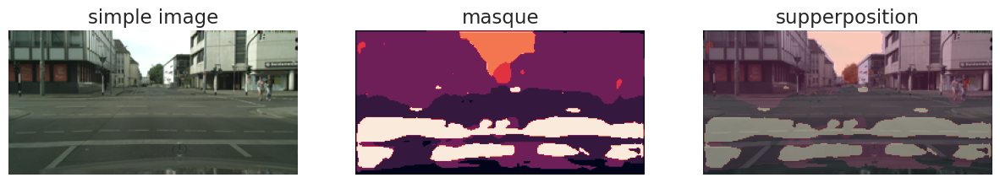

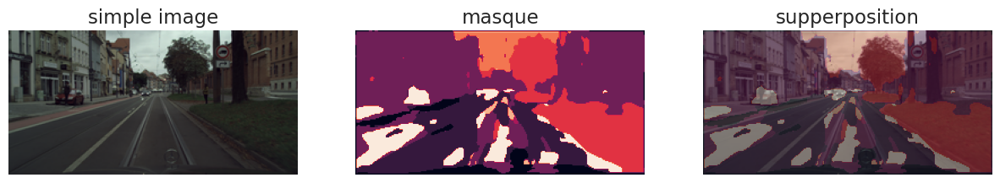

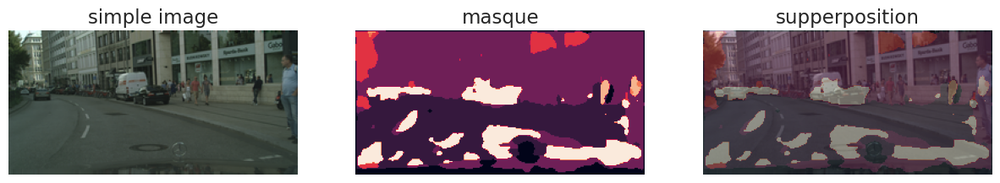

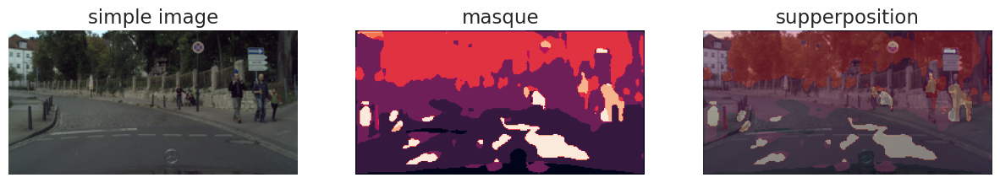

In [28]:
for i in range(len(img)) :
    afficher_les_images_supperposees(img[i], mask_pred[i], style=3)

In [120]:
recap = pd.read_csv("recap_Transfert_learning_UNET+512-32.csv").drop(["Unnamed: 0"], axis = 1)
recap

,mean_IoU,dice_coeff,Tversky_coef,val_mean_IoU,val_dice_coeff,val_Tversky_coef,modèle,Loss,Augmentation
0,0.842273,0.914383,0.271828,0.699934,0.823430,0.263800,Transfert_learning_UNET+512-32,jaccard_loss,False
1,0.568702,0.724629,0.255021,0.459231,0.627754,0.246580,Transfert_learning_UNET+512-32,dice_loss,False
2,0.516508,0.681144,0.252429,0.304611,0.465737,0.233218,Transfert_learning_UNET+512-32,categorical_focal_loss,False
3,0.880238,0.936301,0.273713,0.686438,0.812918,0.262808,Transfert_learning_UNET+512-32,categorical_focal_jaccard_loss,False


In [121]:
#recap = pd.DataFrame([result_1.iloc[-result_1.shape[0]//2:,:].max().values , 
#                      result_2.iloc[-result_2.shape[0]//2:,:].max().values,
#                      result_3.iloc[-result_3.shape[0]//2:,:].max().values, 
#                      result_4.iloc[-result_4.shape[0]//2:,:].max().values,
#                      result_5.iloc[-result_5.shape[0]//2:,:].max().values
#                     ],
#                     columns= result_1.keys()
#                    ).drop(["loss","ARI_score","val_ARI_score","val_loss"], axis = 1)

a_0 = result_5.drop(["loss","ARI_score","val_ARI_score","val_loss"], axis = 1).iloc[-result_5.shape[0]//2:,:].max().values.tolist()

a = [i for  i in recap.values.tolist()]
a.append(a_0)

recap = pd.DataFrame(a , columns=recap.columns)
recap

,mean_IoU,dice_coeff,Tversky_coef,val_mean_IoU,val_dice_coeff,val_Tversky_coef,modèle,Loss,Augmentation
0,0.842273,0.914383,0.271828,0.699934,0.823430,0.263800,Transfert_learning_UNET+512-32,jaccard_loss,False
1,0.568702,0.724629,0.255021,0.459231,0.627754,0.246580,Transfert_learning_UNET+512-32,dice_loss,False
2,0.516508,0.681144,0.252429,0.304611,0.465737,0.233218,Transfert_learning_UNET+512-32,categorical_focal_loss,False
3,0.880238,0.936301,0.273713,0.686438,0.812918,0.262808,Transfert_learning_UNET+512-32,categorical_focal_jaccard_loss,False
4,0.865076,0.927636,0.273050,0.640489,0.779926,0.259966,Transfert_learning_UNET+512-32,categorical_focal_dice_loss,False


In [122]:
recap.style.highlight_min(axis=0, color='red').highlight_max(axis=0, color='green')

,mean_IoU,dice_coeff,Tversky_coef,val_mean_IoU,val_dice_coeff,val_Tversky_coef,modèle,Loss,Augmentation
0,0.842273,0.914383,0.271828,0.699934,0.823430,0.263800,Transfert_learning_UNET+512-32,jaccard_loss,False
1,0.568702,0.724629,0.255021,0.459231,0.627754,0.246580,Transfert_learning_UNET+512-32,dice_loss,False
2,0.516508,0.681144,0.252429,0.304611,0.465737,0.233218,Transfert_learning_UNET+512-32,categorical_focal_loss,False
3,0.880238,0.936301,0.273713,0.686438,0.812918,0.262808,Transfert_learning_UNET+512-32,categorical_focal_jaccard_loss,False
4,0.865076,0.927636,0.273050,0.640489,0.779926,0.259966,Transfert_learning_UNET+512-32,categorical_focal_dice_loss,False


In [123]:
#if "recap.csv" in os.listdir() : 
#    x = pd.read_csv("recep.csv")
#    recap = pd.concat([x , recap], axis = 0, ignore_index=True)
#    recap.drop_duplicates(["modèle","Loss","Augmentation"], inplace=True)

recap.to_csv(f"recap_{model_name}.csv", index = False)
